In [1]:
pip install opencv-contrib-python

Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.


In [2]:
! git checkout -b module-11

fatal: a branch named 'module-11' already exists


In [3]:
# Import modules

# import urllib

import os
import sys
import cv2
import numpy as np
import matplotlib.pyplot as plt

from zipfile import ZipFile
from urllib.request import urlretrieve

from IPython.display import HTML
from matplotlib.animation import FuncAnimation

from IPython.display import YouTubeVideo, display, HTML, Video
from base64 import b64encode

%matplotlib inline

In [4]:
def download_and_unzip(url, save_path):
    print(f"Downloading and extracting assests....", end="")

    # Downloading zip file using urllib package.
    urlretrieve(url, save_path)

    try:
        # Extracting zip file using the zipfile package.
        with ZipFile(save_path) as z:
            # Extract ZIP file contents in the same directory.
            z.extractall(os.path.split(save_path)[0])

        print("Done")

    except Exception as e:
        print("\nInvalid file.", e)

In [5]:
#### URL = r"https://www.dropbox.com/s/ld535c8e0vueq6x/opencv_bootcamp_assets_NB11.zip?dl=1"

# asset_zip_path = os.path.join(os.getcwd(), f"opencv_bootcamp_assets_NB11.zip")

# # Download if assest ZIP does not exists. 
# if not os.path.exists(asset_zip_path):
#     download_and_unzip(URL, asset_zip_path)

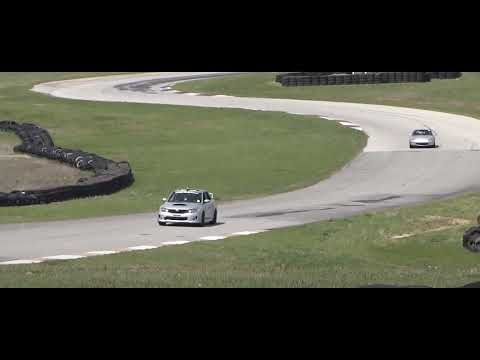

In [6]:
video = YouTubeVideo("XkJCvtCRdVM", width = 1024, height = 640)
display(video)

In [7]:
video_input_file = "race_car.mp4"

def drawRectangle(frame, bbox):
    p1 = (int(bbox[0]), int(bbox[1]))
    p2 = (int(bbox[0] + bbox[2]), int(bbox[1] + bbox[3]))
    cv2.rectangle(frame, p1, p2, (255, 0, 0), thickness = 2,  lineType = cv2.LINE_AA)

def displayRectangle(frame, bbox):
    plt.figure(figsize = [20,10])
    frameCopy = frame.copy()
    drawRectangle(frameCopy, bbox)
    plt.imshow(frameCopy[:,:,::-1])
    plt.axis("off")

def drawText(frame, txt, location, color = (0,255,255)):
    cv2.putText(frame, txt, location, fontFace = cv2.FONT_HERSHEY_SIMPLEX, fontScale = 1.2, color = color, lineType = cv2.LINE_AA)

In [8]:
tracker_types = ["BOOSTING", "MIL", "KCF", "CSRT", "TLD", "MEDIANFLOW", "GOTURN", "MOSSE"]

tracker_type = tracker_types[6]

if tracker_type == tracker_types[0]:
    tracker = cv2.legacy.TrackerBoosting.create()
elif tracker_type == tracker_types[1]:
    tracker = cv2.legacy.TrackerMIL.create()
elif tracker_type == tracker_types[2]:
    tracker = cv2.TrackerKCF.create()
elif tracker_type == tracker_types[3]:
    tracker = cv2.TrackerCSRT.create()
elif tracker_type == tracker_types[4]:
    tracker = cv2.legacy.TrackerTLD.create()
elif tracker_type == tracker_types[5]:
    tracker = cv2.legacy.TrackerMedianFlow.create()
elif tracker_type == tracker_types[6]:
    tracker = cv2.TrackerGOTURN.create()
elif tracker_type == tracker_types[7]:
    tracker = cv2.legacy.TrackerMOSSE.create()

# Reading Input Video and Setting up output video

In [9]:
cap = cv2.VideoCapture(video_input_file)
is_okay , frame = cap.read()

if not is_okay:
    print("Could not open video")
    sys.exit()
else :
    width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))

width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))

video_output_filename = "race-car" + tracker_type + ".mp4"

video_out = cv2.VideoWriter(video_output_filename, cv2.VideoWriter_fourcc(*"mp4v"), 30, (width, height))

# define bounding box

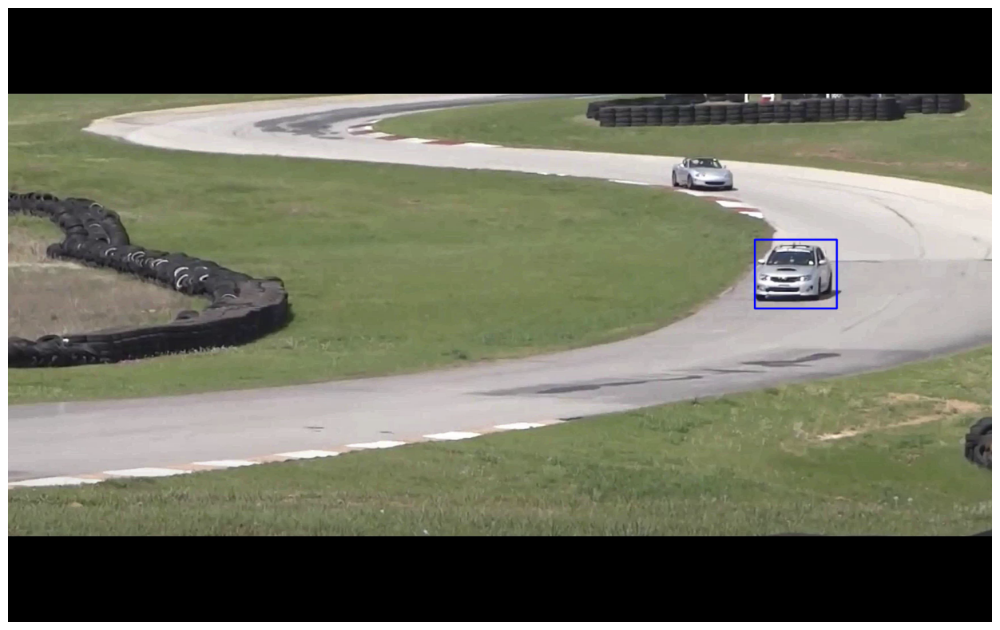

In [10]:
# bbox = [800, 120, 140, 100]
bbox = cv2.selectROI(frame, None)
cv2.destroyAllWindows()
displayRectangle(frame, bbox)


# Initialize Tracker 


In [11]:
# # initialize tracker with first frame and bounding box

ok = tracker.init(frame, bbox)


# Read frame and track object

In [12]:

while True:
    ok, frame = cap.read()
    
    if not ok:
        break
    timer = cv2.getTickCount()
    ok, bbox = tracker.update(frame)
    fps = cv2.getTickFrequency() / (cv2.getTickCount() - timer)
    if not ok:
        drawText(frame, "Failed to detect Object", (50, 50))
    else:
        drawRectangle(frame, bbox)
    drawText(frame, "FPS : " + str(int(fps)), (80, 100))
    video_out.write(frame)
    key = cv2.waitKey(1)
    if key == ord("q"):
        break

cap.release()
video_out.release()


In [18]:
# showing the video

cap = cv2.VideoCapture(video_output_filename)
cv2.namedWindow("w", cv2.WINDOW_NORMAL)
while True:
    ok , frame = cap.read()

    if not ok :
        break
    else:
        cv2.imshow("w", frame)
    cv2.waitKey(1)

cv2.destroyWindow("w")

In [14]:
Video(video_output_filename, embed=True, width=800)

In [15]:
! git checkout   module-11

Already on 'module-11'


In [16]:
! git status

On branch module-11
Untracked files:
  (use "git add <file>..." to include in what will be committed)
	.ipynb_checkpoints/
	abc.mp4
	goturn.caffemodel
	goturn.prototxt
	ldr-drago.jpg
	ldr-mantiuk.jpg
	ldr-reinhard.jpg
	module-11.ipynb
	opencv_bootcamp_assets_NB11.zip
	race-carBOOSTING.mp4
	race-carCSRT.mp4
	race-carGOTURN.mp4
	race-carKCF.mp4
	race-carMEDIANFLOW.mp4
	race-carMIL.mp4
	race-carMOSSE.mp4
	race-carTLD.mp4
	race_car.mp4
	race_car_out.avi
	race_car_out.mp4

nothing added to commit but untracked files present (use "git add" to track)
